<a href="https://colab.research.google.com/github/elenakelly/IRTM/blob/main/word_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
from collections import Counter
import matplotlib.pyplot as plt
import os
import statistics
import math
from nltk.tokenize import sent_tokenize
from nltk.corpus import stopwords
from nltk import ngrams
from wordcloud import WordCloud
from pprint import PrettyPrinter

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
data_dir = 'data/'
book_list = os.listdir(data_dir)
book_names = ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8',
              'B9','B10','B11', 'B12', 'B13', 'B14', 'B15', 'B16']
book_list

['Stephen_King_Carrie.txt',
 'Stephen_King_BlackHouse.txt',
 'Stephen_King_TheDarkTower.txt',
 'Stephen_King_TheDeadZone.txt',
 'Stephen_King_TheGirlWhoLovedTomGordon.txt',
 'Stephen_King_TheLittleSistersOfEluria.txt',
 'Stephen_King_SalemsLot.txt',
 'Stephen_King_TheShining.txt',
 'Stephen_King_It.txt',
 'Stephen_King_Misery.txt',
 'Stephen_King_WizardAndGlass.txt',
 'Stephen_King_TheWasteLands.txt',
 'Stephen_King_SongOfSusannah.txt',
 'Stephen_King_TheGunslinger.txt',
 'Stephen_King_TheDrawingOfTheThree.txt',
 'Stephen_King_BagOfBones.txt']

In [ ]:
books_df = []
for book in book_list:
    df = pd.read_csv(data_dir+book, sep='\n', header=None)
    books_df.append(df)

In [ ]:
books_df[4]._get_value(0,0)[:500]

'CHAPTER This is for my son Owen who ended up teaching me a lot more about the game of baseball than I ever taught him Pregame THE WORLD had teeth and it could bite you with them anytime it wanted Trisha McFarland discovered this when she was nine years old At ten oclock on a morning in early June she was sitting in the back seat of her mothers Dodge Caravan wearing her blue Red Sox batting practice jersey the one with  GORDON on the back and playing with Mona her doll At ten thirty she was lost '

In [ ]:
total_word_count = []
for df in books_df:
    text = df._get_value(0,0)
    count = len(text.split())
    total_word_count.append(count)

total_word_count

[55446,
 234404,
 274186,
 150220,
 61758,
 23114,
 151917,
 163090,
 423017,
 112900,
 258164,
 173054,
 125321,
 56870,
 126192,
 201014]

Text(0.5, 0, 'Stephen King books')

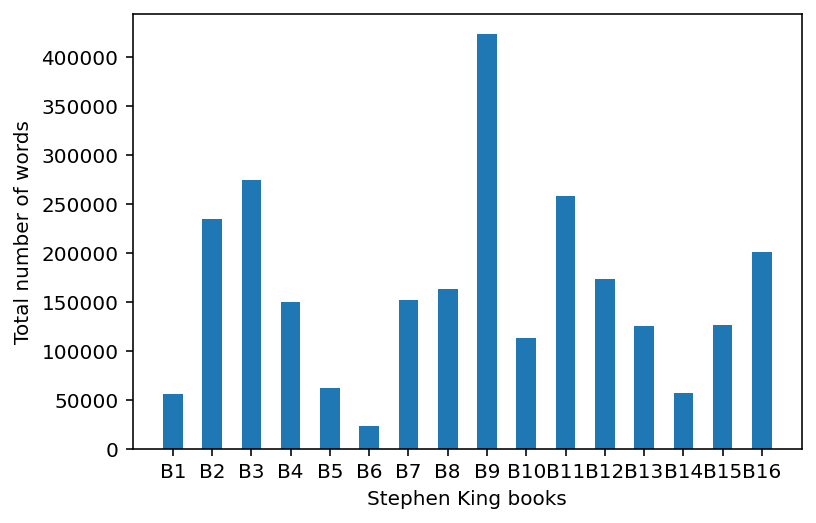

In [ ]:
plt.bar(np.arange(len(book_names)),
        total_word_count, width=0.5, 
        tick_label=book_names)
plt.ylabel('Total number of words')
plt.xlabel('Stephen King books')

In [ ]:
#unique words
unique_words_list = []
for df in books_df:
    text = df._get_value(0,0)
    unique_words_len = len(set(word for word in text.split()))
    unique_words_list.append(unique_words_len)

unique_words_list

[8337,
 18770,
 20570,
 13697,
 6960,
 3876,
 13874,
 13970,
 26570,
 11011,
 16965,
 14032,
 13184,
 7644,
 11262,
 15299]

Text(0, 0.5, 'Unique words')

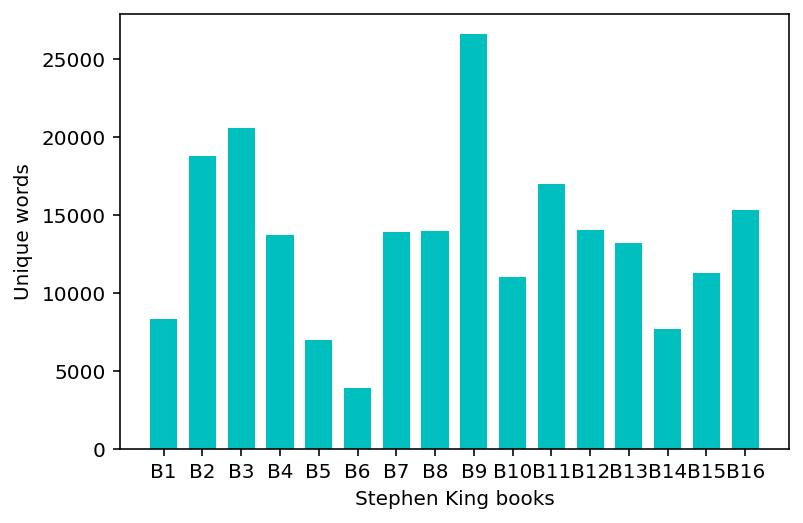

In [ ]:
plt.bar(np.arange(len(book_names)), unique_words_list, 
        width=0.7, tick_label=book_names, color='c')
plt.xlabel('Stephen King books')
plt.ylabel('Unique words')

In [ ]:
# most common words
common_words_counter = []
for df in books_df:
    text = df._get_value(0,0)
    counter = Counter()
    for word in text.split():
        if word not in stopwords.words('english') :
            counter[word] += 1
    common_words_counter.append(counter)

In [ ]:
pp = PrettyPrinter(indent=2)
for i, freq in enumerate(common_words_counter):
    print('-------- Book'+str(i+1)+' --------')
    common = freq.most_common()[:10]
    for tup in common:
        pp.pprint(tup)

-------- Book1 --------
('I', 582)
('She', 475)
('The', 429)
('Carrie', 305)
('said', 213)
('like', 200)
('It', 192)
('A', 183)
('He', 165)
('one', 152)
-------- Book2 --------
('I', 1738)
('Jack', 1588)
('The', 1221)
('He', 1206)
('says', 1187)
('like', 901)
('one', 799)
('back', 635)
('Dale', 583)
('And', 521)
-------- Book3 --------
('I', 1907)
('Roland', 1762)
('said', 1511)
('He', 1442)
('The', 1401)
('one', 1284)
('would', 1050)
('And', 866)
('Susannah', 810)
('like', 787)
-------- Book4 --------
('I', 1650)
('Johnny', 1381)
('He', 1205)
('said', 1130)
('The', 956)
('like', 535)
('one', 510)
('back', 468)
('It', 458)
('She', 433)
-------- Book5 --------
('She', 693)
('Trisha', 473)
('The', 311)
('like', 265)
('one', 244)
('back', 241)
('would', 238)
('It', 208)
('could', 204)
('little', 196)
-------- Book6 --------
('Roland', 246)
('The', 173)
('He', 161)
('like', 115)
('I', 115)
('one', 106)
('Sister', 102)
('said', 99)
('back', 89)
('could', 78)
-------- Book7 --------
('He', 1

In [ ]:
pp = PrettyPrinter(indent=2)
for i, freq in enumerate(common_words_counter):
    print('-------- Book'+str(i+1)+' --------')
    common = freq.most_common()[-10:]
    for tup in common:
        pp.pprint(tup)

-------- Book1 --------
('gramma', 1)
('guns', 1)
('wasen', 1)
('shure', 1)
('heartspels', 1)
('Rich', 1)
('pitchers', 1)
('brite', 1)
('worldbeeter', 1)
('Melia', 1)
-------- Book2 --------
('sag', 1)
('paroles', 1)
('cough', 1)
('heals', 1)
('Epilogue', 1)
('SHE', 1)
('SITS', 1)
('passageway', 1)
('Corn', 1)
('ADayo', 1)
-------- Book3 --------
('penalized', 1)
('fictionalized', 1)
('geography', 1)
('trusting', 1)
('privacy', 1)
('katetnow', 1)
('sorryI', 1)
('sharing', 1)
('knownone', 1)
('alasthat', 1)
-------- Book4 --------
('video', 1)
('recorders', 1)
('bands', 1)
('handsbreadth', 1)
('raggedly', 1)
('straightening', 1)
('pleasantratherthanhandsome', 1)
('lanky', 1)
('monument', 1)
('gateposts', 1)
-------- Book5 --------
('hon', 1)
('Goodness', 1)
('transferred', 1)
('IV', 1)
('translate', 1)
('index', 1)
('ceiling', 1)
('sweetest', 1)
('truest', 1)
('understanding', 1)
-------- Book6 --------
('mule', 1)
('content', 1)
('Several', 1)
('chasing', 1)
('worst', 1)
('memories', 1

"for freq in common_words_counter:\n     wc = WordCloud(width=100, height=75, stopwords='said', background_color='white', max_words=1500)\n     wc.generate_from_frequencies(freq)\n     plt.imshow(wc, interpolation='bilinear')\n     plt.axis('off')\n     plt.show()"

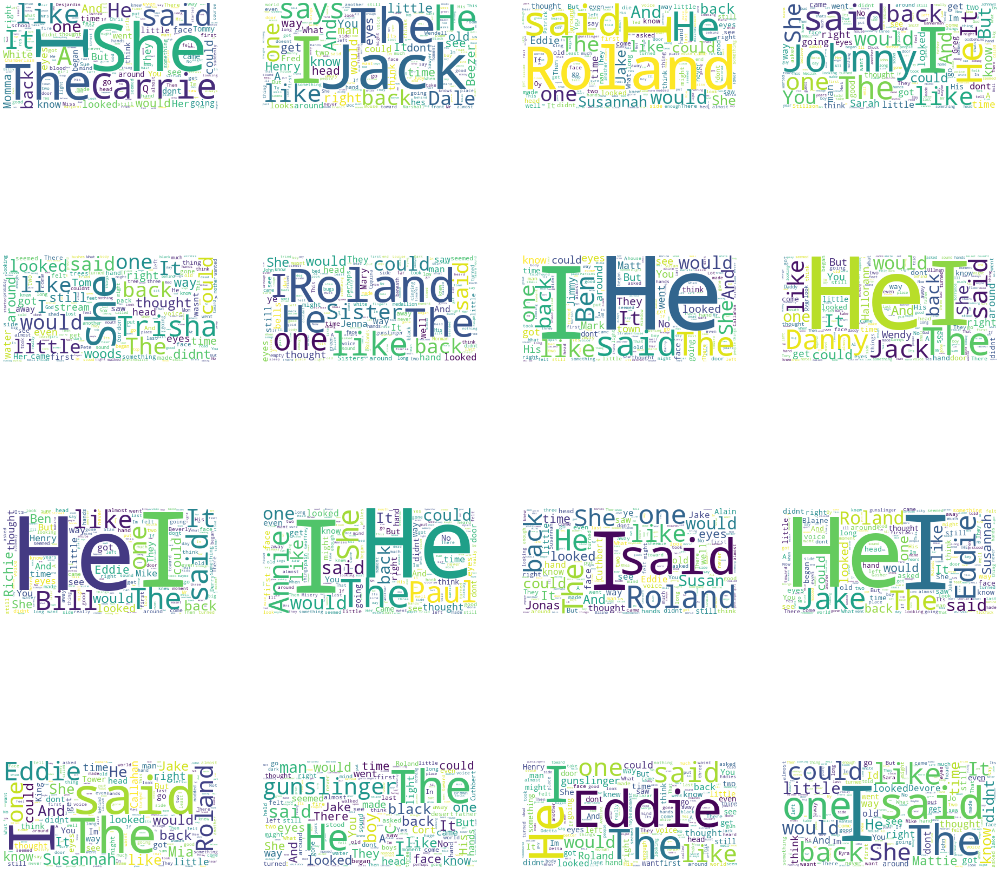

In [ ]:
plt.rcParams["figure.figsize"] = (50,50)
fig, axes = plt.subplots(nrows=4, ncols=4)
subplots = [(0,0),(0,1),(0,2),(0,3),
            (1,0),(1,1),(1,2),(1,3),
            (2,0),(2,1),(2,2),(2,3),
            (3,0),(3,1),(3,2),(3,3)]

for i, (freq,subplot) in enumerate(zip(common_words_counter,subplots)):
    wc = WordCloud( stopwords='said', background_color='white', max_words=200)
    wc.generate_from_frequencies(freq)
    axes[subplot[0],subplot[1]].imshow(wc, interpolation='bilinear')
    axes[subplot[0],subplot[1]].axis('off')
'''for freq in common_words_counter:
     wc = WordCloud(width=100, height=75, stopwords='said', background_color='white', max_words=1500)
     wc.generate_from_frequencies(freq)
     plt.imshow(wc, interpolation='bilinear')
     plt.axis('off')
     plt.show()'''
